**Auswertung:**

- Idea was for all: Start with one agent and then use this network for all agents
- did not seem to work properly

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import os
import sys
import ast
import pickle

glp = os.path.abspath("../code")
if not glp in sys.path: sys.path.append( glp )

from global_paths import global_paths

if not global_paths["COBS"] in sys.path: sys.path.append( global_paths["COBS"] )

In [3]:
import cobs
import torch
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import subprocess

In [4]:
import StateUtilities as SU

In [5]:
import visualization_helper_v2 as vh

In [6]:
fig_width = 30

In [7]:
dirnames = ["../checkpoints/b001/",
            "../checkpoints/s306/20210603-1333/",
            "../checkpoints/s307/20210603-1340/",
            "../checkpoints/s307-v2/20210603-1341/",
            "../checkpoints/s306/20210612-1948/",
            "../checkpoints/s307-v2/20210612-1702/"]

In [8]:
alldfs = [ vh.convert_sqlite_to_df(dirname) for dirname in dirnames ]

Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table s

In [9]:
q_values = vh.load_and_convert_q_values(dirnames)

No Q-value list found for ../checkpoints/b001/.


In [10]:
vh.get_arguments_overview(dirnames)

,b001,s306,s307,s307-v2,s306_5,s307-v2_6
algorithm,baseline_rule-based,ddqn,ddqn,ddqn,ddqn,ddqn
ddqn_new,0,NaN,NaN,NaN,1,1
lr,0.01,0.1,0.1,0.1,0.1,0.1
batch_size,128,256,256,256,256,256
lambda_rwd_mstpc,0.1,0.12,0.12,0.12,0.0365,0.0365
lambda_rwd_energy,5e-06,0.017,0.017,0.017,0.004,0.004
energy_cons_in_kWh,0,1,1,1,1,1
reward_offset,0.0,0.3,0.3,0.3,0.3,0.3
stp_reward_step_offset,1.0,1.0,1.0,1.0,0.0,0.0
clip_econs_at,0.0,150.0,150.0,150.0,0.0,0.0


In [11]:
vh.get_runtime_overview_df(alldfs, dirnames)

,b001,s306,s307,s307-v2,s306,s307-v2
Number of training episodes,1.0,33750.000000,33750.000000,33810.000000,33750.000000,33750.000000
Runtime in s,0.0,168091.012953,184078.565728,169552.748272,201946.117578,180941.760327
Runtime in h,0.0,46.691948,51.132935,47.097986,56.096144,50.261600
Mean episode runtime in s,0.0,4.980474,5.454180,5.014870,5.983589,5.361237
Mean episode runtime during eval. episode in s,0.0,5.124673,5.640930,5.228959,5.837402,5.309938
Mean episode runtime after eval. episode in s,NaN,4.908265,5.371059,4.993703,5.893490,5.332019
Mean episode runtime in no eval. episode in s,NaN,4.979938,5.453485,5.014063,5.984132,5.361428


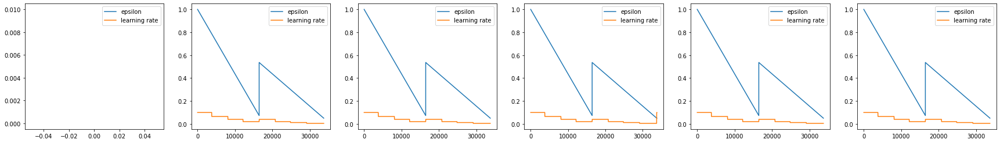

In [12]:
p, _ = vh.complete_plot_epsilon(alldfs, fig_width)
p.show()

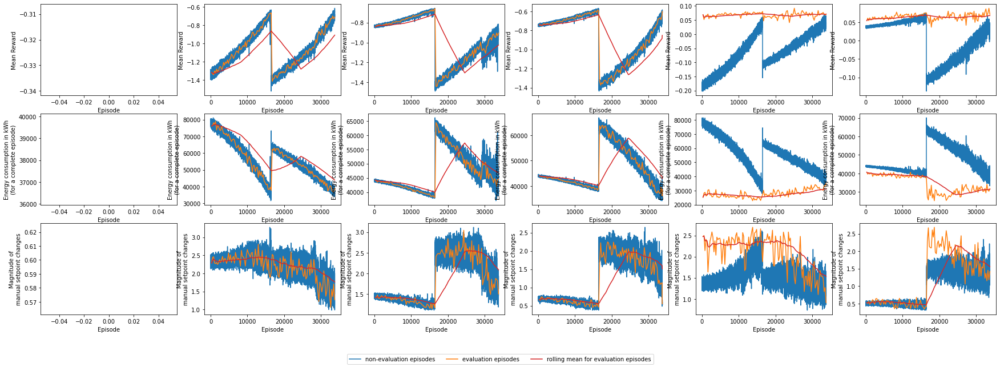

In [13]:
p, _ = vh.complete_plot_reward_stpc_econs(alldfs, fig_width)
p.show()

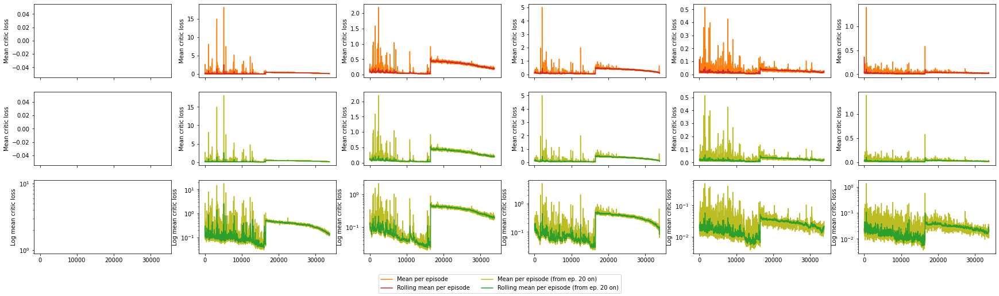

In [14]:
p, _ = vh.complete_plot_losses(alldfs, fig_width, with_agents=False)
p.show()

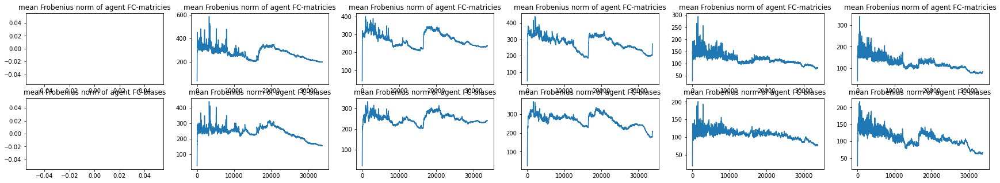

In [15]:
p, _ = vh.complete_plot_frobenius_norms(alldfs, fig_width, with_critics=False)
p.show()

In [16]:
last_available_eval_episodes = vh.compute_last_available_eval_episode(alldfs)

Last available evaluation episode for dfs0:      0
Last available evaluation episode for dfs1:  33749
Last available evaluation episode for dfs2:  33749
Last available evaluation episode for dfs3:  33799
Last available evaluation episode for dfs4:  33749
Last available evaluation episode for dfs5:  33749


<h3>Details for one week</h3>

In [17]:
#selected_episodes = [13120 - 1, 14480 - 1, 14480 - 1]
#selected_weeks    = [datetime.datetime(2017, 1, 1), datetime.datetime(2017, 1, 1), datetime.datetime(2017, 1, 1)]

In [18]:
if not "selected_episodes" in locals().keys():
    selected_episodes = last_available_eval_episodes.copy()
if not "selected_weeks" in locals().keys():
    # the start of the evaluation episode
    selected_weeks = [datetime.datetime.strptime(dfs['sees'].iloc[0]["datetime"], "%Y-%m-%d %H:%M:%S")
                      for dfs in alldfs]

subdfs = vh.select_week_and_episode_for_dfs_list(alldfs, selected_episodes, selected_weeks)

In [19]:
vh.print_reward_informations(subdfs, selected_episodes)

First complete week of evaluation episode
For episode     0: Energy consumption:   38042.14 kWh; Sum of setpoint change magnitudes: 426.88118883889297
For episode 33749: Energy consumption:   39037.25 kWh; Sum of setpoint change magnitudes: 914.405146013676
For episode 33749: Energy consumption:   44486.29 kWh; Sum of setpoint change magnitudes: 1082.4046102054667
For episode 33799: Energy consumption:   38619.04 kWh; Sum of setpoint change magnitudes: 398.20309378014343
For episode 33749: Energy consumption:   35065.78 kWh; Sum of setpoint change magnitudes: 655.9158873532581
For episode 33749: Energy consumption:   31709.90 kWh; Sum of setpoint change magnitudes: 1019.8769845484808

Mean values for episode ...
...     0: Reward: -0.32392 kWh; Setpoint change magnit.:  0.59372; Energy cons.: 52909.78911
... 33749: Reward: -0.71129 kWh; Setpoint change magnit.:  1.27177; Energy cons.: 54293.80728
... 33749: Reward: -0.90503 kWh; Setpoint change magnit.:  1.50543; Energy cons.: 61872.45

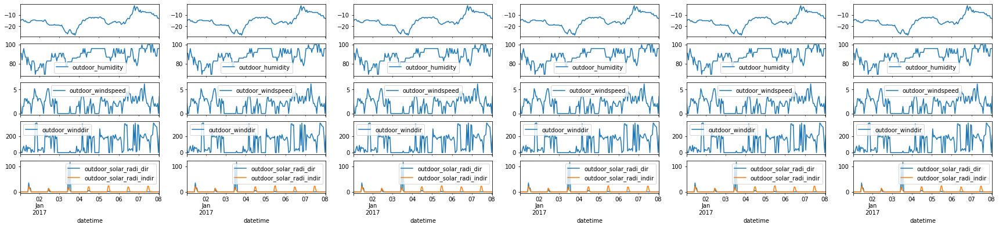

In [20]:
p, _ = vh.complete_plot_weather_information(subdfs, fig_width)
p.show()

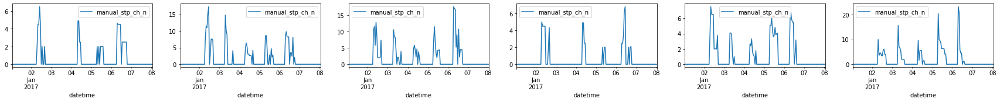

In [21]:
p, _ = vh.complete_plot_number_of_stp_ch(subdfs, fig_width)
p.show()

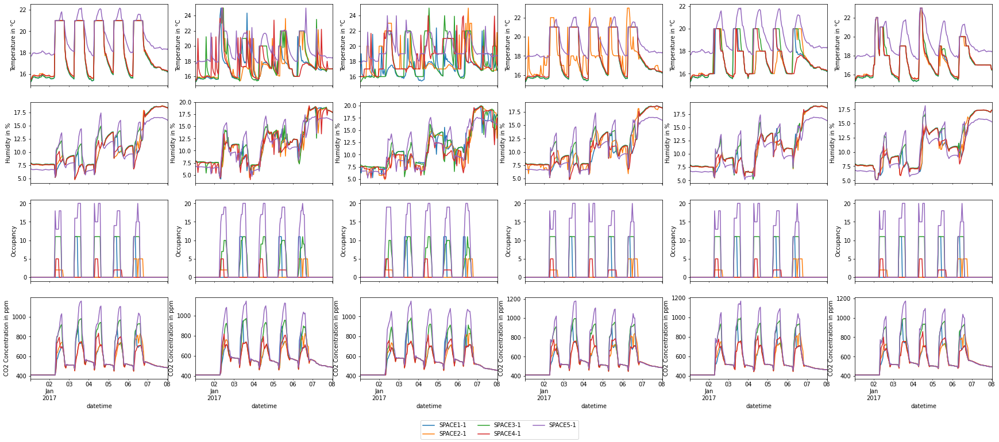

In [22]:
p, _ = vh.complete_plot_room_status(subdfs, fig_width)
p.show()

In [23]:
subdfs_rooms, subdfs_agents = vh.get_available_rooms_and_agents(subdfs)

Available Rooms     in (sub-)dfs0: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs0: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs1: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs1: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs2: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs2: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs3: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs3: {'SPACE2-1': 0, 'SPACE5-1': 1, 'SPACE4-1': 2, 'SPACE3-1': 3, 'SPACE1-1': 4} 

Available Rooms     in (sub-)dfs4: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs4: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4

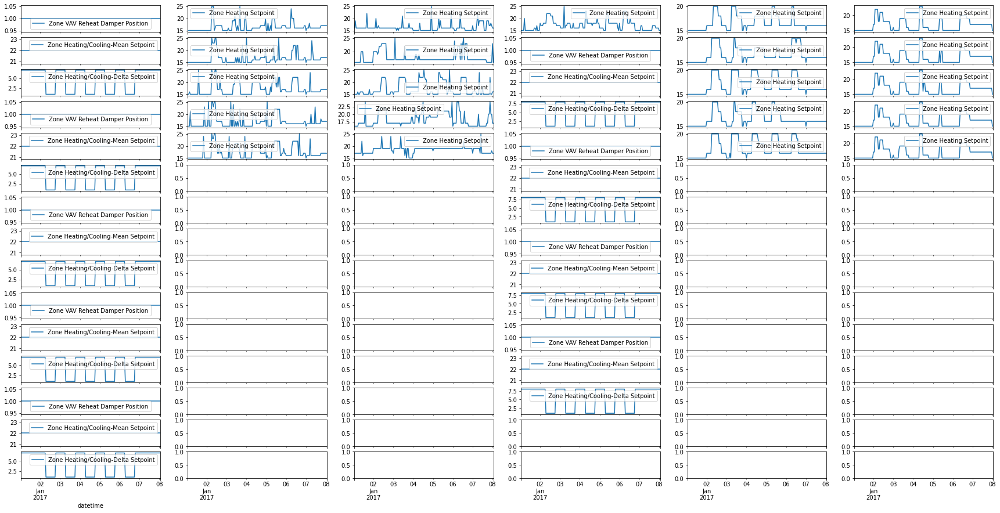

In [24]:
p, _ = vh.complete_plot_all_agent_outputs(subdfs, fig_width, subdfs_agents)
p.show()

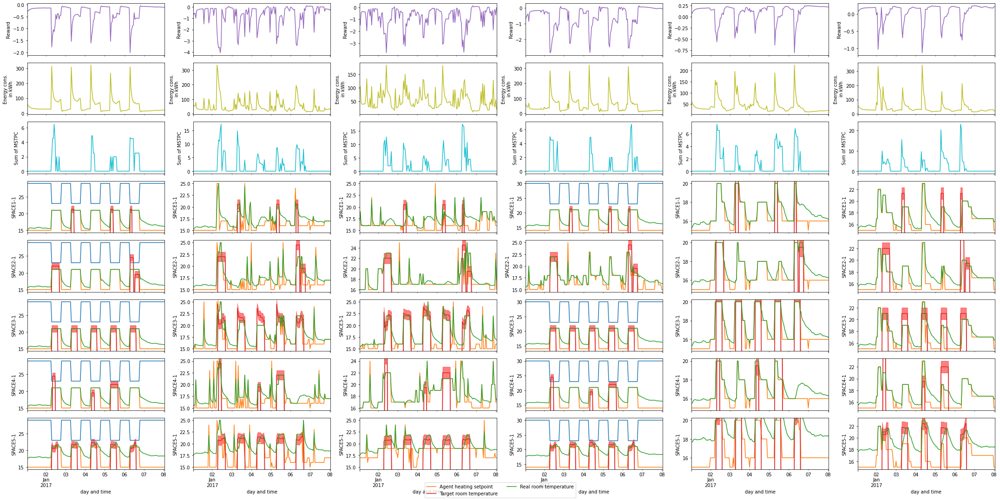

In [25]:
p, _ = vh.complete_plot_total_overview(subdfs, fig_width, subdfs_rooms, subdfs_agents)
p.show()

<h3>Details for a day</h3>

In [26]:
#selected_periods1    = [datetime.datetime(2017, 1, 3),
#                        datetime.datetime(2017, 1, 3),
#                        datetime.datetime(2017, 1, 3)]
#selected_periods1_end= [datetime.datetime(2017, 1, 4),
#                        datetime.datetime(2017, 1, 4),
#                        datetime.datetime(2017, 1, 4)]

In [27]:
if not "selected_periods1" in locals().keys():
    selected_periods1     = [datetime.datetime(2017, 1, 3) for _ in range(len(alldfs))]
if not "selected_periods1_end" in locals().keys():
    selected_periods1_end = [datetime.datetime(2017, 1, 4) for _ in range(len(alldfs))]

subdfs = vh.select_week_and_episode_with_end_for_dfs_list(
            alldfs,
            selected_episodes,
            selected_periods1,
            selected_periods1_end)

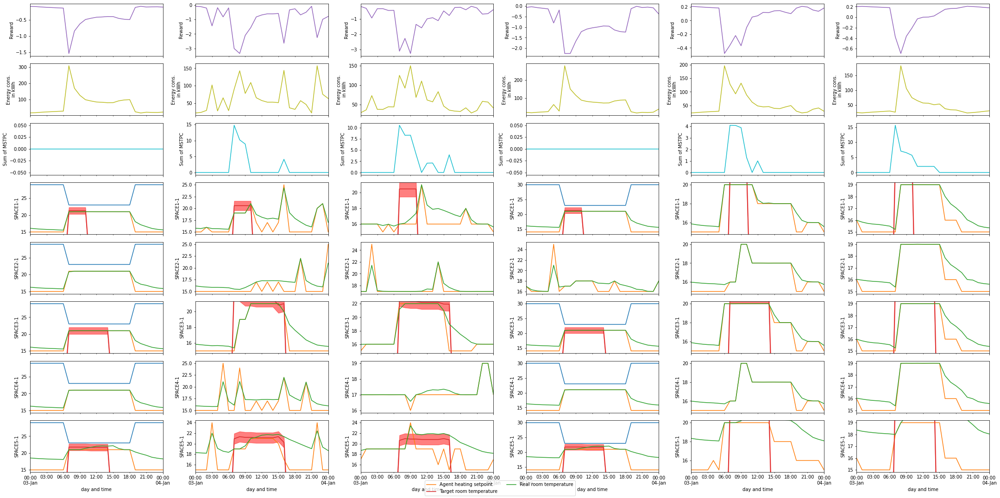

In [28]:
p, _ = vh.complete_plot_total_overview(subdfs, fig_width, subdfs_rooms, subdfs_agents)
p.show()

<h3>Details for a complete month</h3>

In [29]:
#selected_periods2    = [datetime.datetime(2017, 1, 1),
#                        datetime.datetime(2017, 1, 1),
#                        datetime.datetime(2017, 1, 1)]

In [30]:
if not "selected_periods2" in locals().keys():
    selected_periods2     = [datetime.datetime(2017, 1, 1) for _ in range(len(alldfs))]
selected_periods2_end = [datetime.datetime(2017, 1, 30) for _ in range(len(alldfs))]

subdfs = vh.select_week_and_episode_with_end_for_dfs_list(
            alldfs,
            selected_episodes,
            selected_periods2,
            selected_periods2_end)

For plot number 1, mean energy consumption =  52002.0 Wh, mean reward = -0.3174
For plot number 2, mean energy consumption =  53357.2 Wh, mean reward = -0.6977
For plot number 3, mean energy consumption =  60555.7 Wh, mean reward = -0.8751
For plot number 4, mean energy consumption =  52765.2 Wh, mean reward = -0.5838
For plot number 5, mean energy consumption =  47828.8 Wh, mean reward =  0.0767
For plot number 6, mean energy consumption =  44204.7 Wh, mean reward =  0.0770


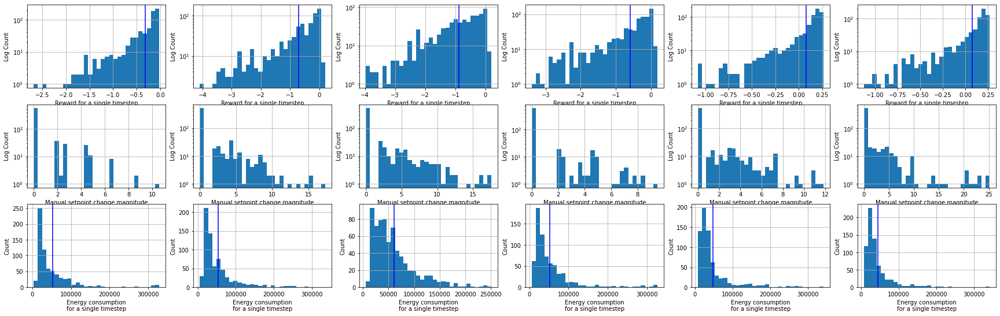

In [31]:
vh.plot_stpch_and_econs_distrib(subdfs, fig_width)

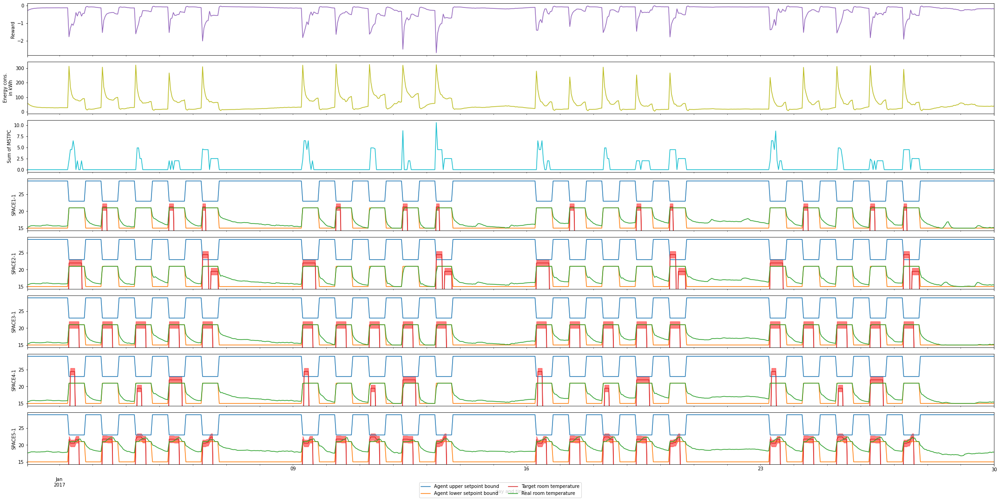

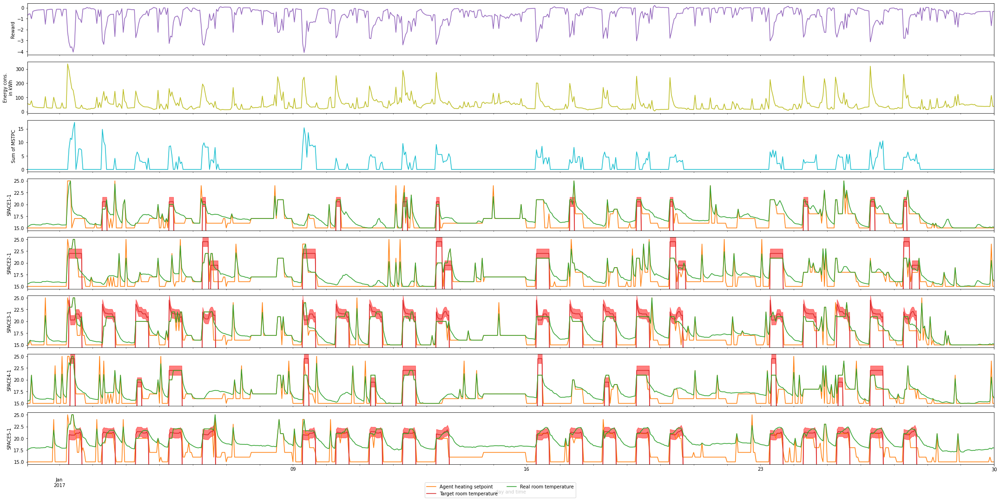

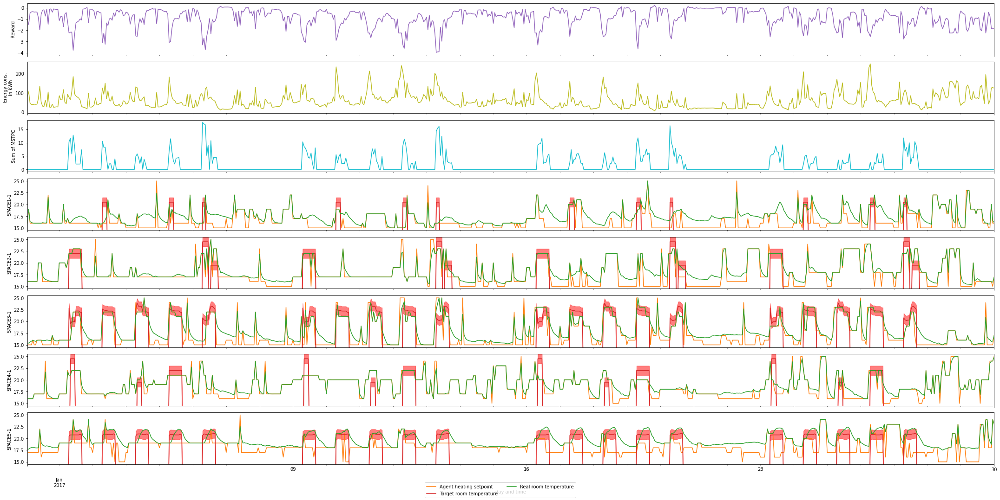

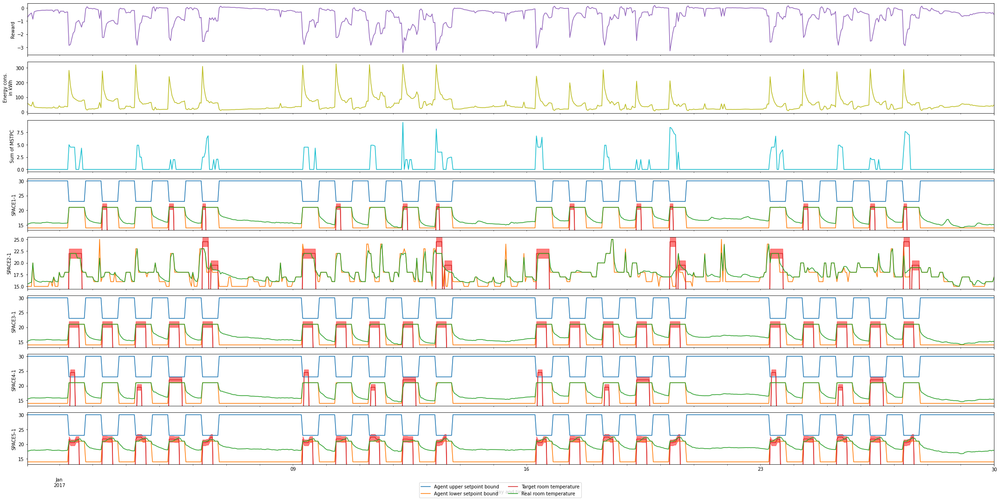

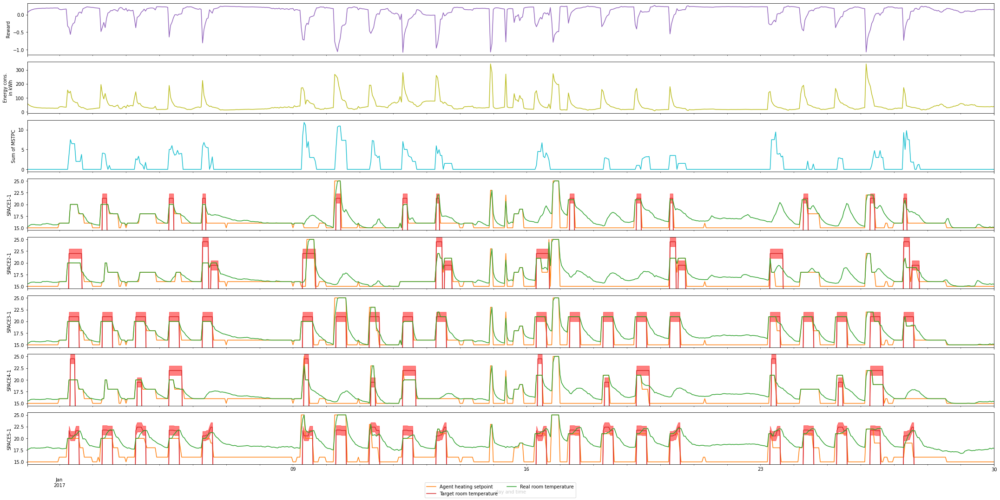

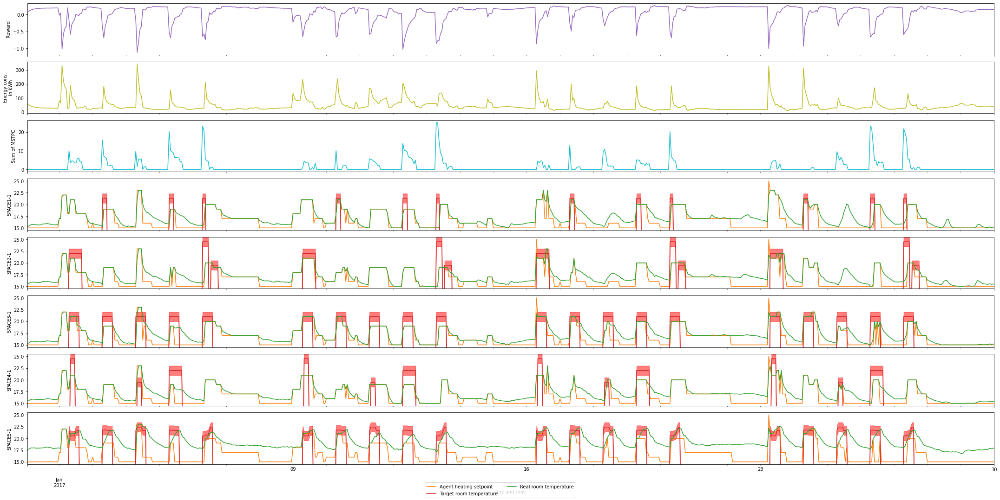

In [32]:
for idx, sdfs in enumerate(subdfs):
    p, _ = vh.complete_plot_total_overview(sdfs, fig_width,
                                           subdfs_rooms[idx],
                                           subdfs_agents[idx])
    p.show()

(<Figure size 2160x5400 with 50 Axes>,
 array([<AxesSubplot:ylabel='Scenario 1: s306\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 1: s306\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 1: s306\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 1: s306\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 1: s306\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 2: s307\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 2: s307\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 2: s307\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 2: s307\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 2: s307\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 3: s307-v2\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 3: s307-v2\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 3: s307-v2\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 3: s307-v2\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 3: s307-v2\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 4: s306\nAgent 0'>,
        <AxesSubpl

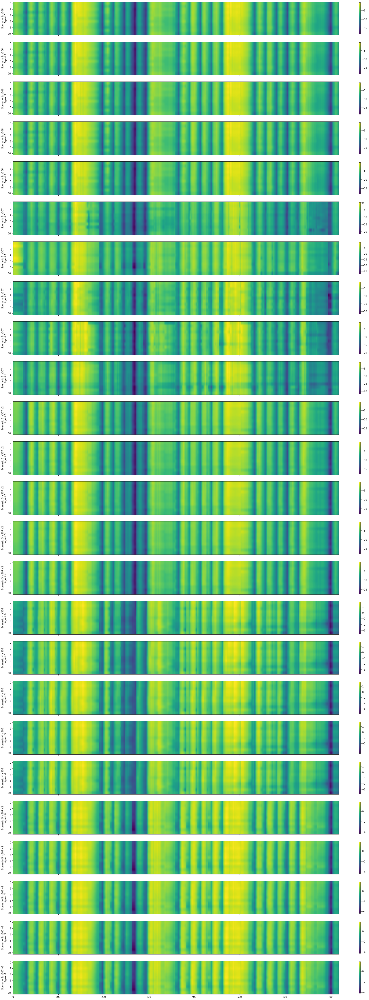

In [33]:
vh.plot_q_values(q_values, fig_width)

Outputs for thesis

In [34]:
if not "selected_episodes" in locals().keys():
    selected_episodes = last_available_eval_episodes.copy()
if not "selected_weeks" in locals().keys():
    # the start of the evaluation episode
    selected_weeks = [datetime.datetime.strptime(dfs['sees'].iloc[0]["datetime"], "%Y-%m-%d %H:%M:%S")
                      for dfs in alldfs]

subdfs = vh.select_week_and_episode_for_dfs_list(alldfs, selected_episodes, selected_weeks)

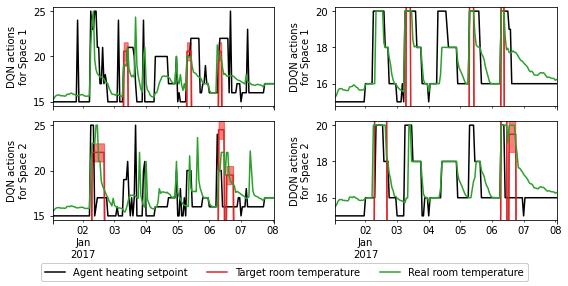

In [52]:
p, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(8,4))
vh.plot_room_temp_agent_setpoint(subdfs[1], 'SPACE1-1', 4, axes[0,0], fill_between=True, heating_setpoint_color='k')
vh.plot_room_temp_agent_setpoint(subdfs[1], 'SPACE2-1', 0, axes[1,0], fill_between=True, heating_setpoint_color='k')
vh.plot_room_temp_agent_setpoint(subdfs[4], 'SPACE1-1', 4, axes[0,1], fill_between=True, heating_setpoint_color='k')
vh.plot_room_temp_agent_setpoint(subdfs[4], 'SPACE2-1', 0, axes[1,1], fill_between=True, heating_setpoint_color='k')
axes[0,0].set_ylabel("DQN actions\nfor Space 1")
axes[1,0].set_ylabel("DQN actions\nfor Space 2")
axes[0,1].set_ylabel("DDQN actions\nfor Space 1")
axes[1,1].set_ylabel("DDQN actions\nfor Space 2")
handles, labels = axes[1,1].get_legend_handles_labels()
p.legend(handles, labels, loc='lower center', ncol=3, framealpha=1)
p.tight_layout()
p.show()
p.savefig("saved_plots/MA_s306DQN_DDQN_TestDay_selection.png", bbox_inches="tight")
p.savefig("saved_plots/MA_s306DQN_DDQN_TestDay_selection.pdf", bbox_inches="tight")

In [45]:
q_values.keys()

dict_keys(['0: b001', '1: s306', '2: s307', '3: s307-v2', '4: s306', '5: s307-v2'])

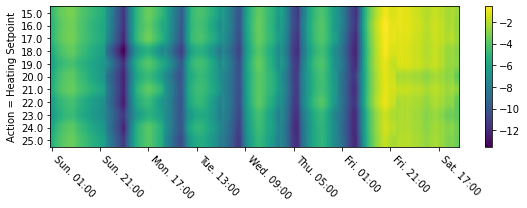

In [46]:
plt.figure(figsize=(8,3))
number_steps = subdfs[-1]["sees"].shape[0]
plotdata = q_values['1: s306'][0][:,:].T
im = plt.imshow(plotdata[:,0:number_steps], aspect='auto')
xt = plt.xticks()[0][1:-1]
xt_val = [subdfs[-1]["sees"].index[int(i)].strftime("%a. %H:%M") for i in xt ]
plt.xticks(xt, xt_val, rotation=-45, ha="left")
cbar = plt.colorbar(im, ax=plt.gca(), location='right')
plt.ylabel("Action = Heating Setpoint")
plt.yticks(np.arange(0,11,1), np.linspace(15,25,11))
plt.tight_layout()
#plt.savefig("saved_plots/MA_s110_TestWeek_Q_vals.png")
#plt.savefig("saved_plots/MA_s110_TestWeek_Q_vals.pdf")

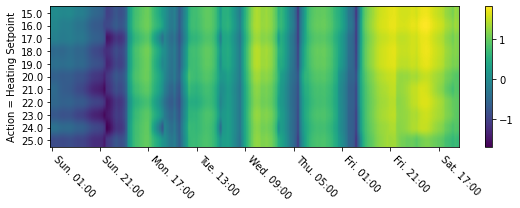

In [47]:
plt.figure(figsize=(8,3))
number_steps = subdfs[-1]["sees"].shape[0]
plotdata = q_values['4: s306'][0][:,:].T
im = plt.imshow(plotdata[:,0:number_steps], aspect='auto')
xt = plt.xticks()[0][1:-1]
xt_val = [subdfs[-1]["sees"].index[int(i)].strftime("%a. %H:%M") for i in xt ]
plt.xticks(xt, xt_val, rotation=-45, ha="left")
cbar = plt.colorbar(im, ax=plt.gca(), location='right')
plt.ylabel("Action = Heating Setpoint")
plt.yticks(np.arange(0,11,1), np.linspace(15,25,11))
plt.tight_layout()
#plt.savefig("saved_plots/MA_s110_TestWeek_Q_vals.png")
#plt.savefig("saved_plots/MA_s110_TestWeek_Q_vals.pdf")